# Init

**Install dependencies**

In [ ]:
!pip3 install wget

  Created wheel for wget: filename=wget-3.2-cp36-none-any.whl size=9682 sha256=eef123601de322b6224dd754f776e88a103fbd56c83bf07ca961758b7cd119ee
  Stored in directory: /root/.cache/pip/wheels/40/15/30/7d8f7cea2902b4db79e3fea550d7d7b85ecb27ef992b618f3f
Successfully built wget


**Import dependencies**

In [ ]:
import os
import zipfile
import torchvision
from torch.utils.data import Dataset, Subset, DataLoader
import torch
from torchvision.transforms import Resize, Compose, ToTensor, Normalize, Grayscale, ToPILImage, GaussianBlur, CenterCrop
import wget
import glob
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt

**Define configuration**

In [ ]:
# Links from https://data.vision.ee.ethz.ch/cvl/DIV2K/
DIV2K_HOST = 'http://data.vision.ee.ethz.ch/cvl/DIV2K/'
DATA_FOLDER = 'data/'
DIV2K_DATASET_ROOT = DATA_FOLDER + 'DIV2K/'
DIV2K_TRAIN_ROOT = DIV2K_DATASET_ROOT + 'train/'
DIV2K_VALID_ROOT = DIV2K_DATASET_ROOT + 'valid/'
DIV2K_TRAIN_PREFIX = 'DIV2K_train'
DIV2K_VALID_PREFIX = 'DIV2K_valid'

# Define Modules

**Define Dataset links**

In [ ]:
links = {
    # (NTIRE 2017) Low Res Images
    'bicubic_x2' : {
        'path'      : 'LR_bicubic',
        'downscale' : 'X2',
        'train'     : 'DIV2K_train_LR_bicubic_X2.zip',
        'valid'     : 'DIV2K_valid_LR_bicubic_X2.zip'
    },
    'unknown_x2' : {
        'path'      : 'LR_unknown',
        'downscale' : 'X2',
        'train'     : 'DIV2K_train_LR_unknown_X2.zip',
        'valid'     : 'DIV2K_valid_LR_unknown_X2.zip'
    },
    'bicubic_x3' : {
        'path'      : 'LR_bicubic',
        'downscale' : 'X3',
        'train'     : 'DIV2K_train_LR_bicubic_X3.zip',
        'valid'     : 'DIV2K_valid_LR_bicubic_X3.zip'
    },
    'unknown_x3' : {
        'path'      : 'LR_unknown',
        'downscale' : 'X3',
        'train'     : 'DIV2K_train_LR_unknown_X3.zip',
        'valid'     : 'DIV2K_valid_LR_unknown_X3.zip'
    },
    'bicubic_x4' : {
        'path'      : 'LR_bicubic',
        'downscale' : 'X4',
        'train'     : 'DIV2K_train_LR_bicubic_X4.zip',
        'valid'     : 'DIV2K_valid_LR_bicubic_X4.zip'
    },
    'unknown_x4' : {
        'path'      : 'LR_unknown',
        'downscale' : 'X4',
        'train'     : 'DIV2K_train_LR_unknown_X4.zip',
        'valid'     : 'DIV2K_valid_LR_unknown_X4.zip'
    },
    # (NTIRE 2018) Low Res Images
    'bicubic_x8' : {
        'path'      : 'LR_bicubic',
        'downscale' : 'X4',
        'train'     : 'DIV2K_train_LR_x8.zip',
        'valid'     : 'DIV2K_valid_LR_x8.zip'
    },
    'mild_x4' : {
        'path'      : 'LR_mild',
        'downscale' : 'X4',
        'train'     : 'DIV2K_train_LR_mild.zip',
        'valid'     : 'DIV2K_valid_LR_mild.zip'
    },
    'difficult_x4' : {
        'path'      : 'LR_difficult',
        'downscale' : 'X4',
        'train'     : 'DIV2K_train_LR_difficult.zip',
        'valid'     : 'DIV2K_valid_LR_difficult.zip'
    },
    'wild_x4' : {
        'path'      : 'LR_wild',
        'downscale' : 'X4',
        'train'     : 'DIV2K_train_LR_wild.zip',
        'valid'     : 'DIV2K_valid_LR_wild.zip'
    },
    # High Resolution Images
    'HR_images' : { 
        'path'      : 'HR',
        'downscale' : '',
        'train'     : 'DIV2K_train_HR.zip',
        'valid'     : 'DIV2K_valid_HR.zip'
    }
}

**Define Import Function**

In [ ]:
# Download and unzip DIV2K images
# eg. sets = {'bicubic_x4' : 'all', 'unknown_x2' : 'train', 'unknown_x4' : 'valid'}
def DIV2KImport(sets={}):
    if not os.path.exists(DIV2K_DATASET_ROOT):
        os.mkdir(DATA_FOLDER)
        os.mkdir(DIV2K_DATASET_ROOT)
        os.mkdir(DIV2K_TRAIN_ROOT)
        os.mkdir(DIV2K_VALID_ROOT)

    for key, value in sets.items():
        load_train = True
        load_valid = True

        link = links[key]

        if value == 'train':
            load_valid = False
        elif value == 'valid':
            load_train = False

        path, downscale = DIV2KSubset2Folder(key)
        expected_train_folder = os.path.join(DIV2K_TRAIN_ROOT, DIV2KTrainFolder(path, downscale))
        expected_valid_folder = os.path.join(DIV2K_VALID_ROOT, DIV2KValidFolder(path, downscale))

        if load_train:
            if not os.path.exists(expected_train_folder):
                train_path_zip = wget.download(DIV2K_HOST + link['train'])
                # os.system('wget ' + DIV2K_HOST + link['train'] + ' -P ' + DIV2K_TRAIN_ROOT)
                # train_path_zip = os.path.join(DIV2K_TRAIN_ROOT, link['train'])
                with zipfile.ZipFile(train_path_zip, 'r') as zip_ref:
                    zip_ref.extractall(DIV2K_TRAIN_ROOT)
                os.remove(train_path_zip) 
        if load_valid:
            if not os.path.exists(expected_valid_folder):
                valid_path_zip = wget.download(DIV2K_HOST + link['valid'])
                # os.system('wget ' + DIV2K_HOST + link['valid'] + ' -P ' + DIV2K_VALID_ROOT)
                # valid_path_zip = os.path.join(DIV2K_VALID_ROOT, link['valid'])
                with zipfile.ZipFile(valid_path_zip, 'r') as zip_ref:
                    zip_ref.extractall(DIV2K_VALID_ROOT)
                os.remove(valid_path_zip)

**Utils**

In [ ]:
def get_mgrid(sidelength, dim=2):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelength)])
    mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid

# eg. 'bicubic_x2' => ['bicubic', 'X2']
def DIV2KSubset2Folder(subset):
    return links[subset]['path'], links[subset]['downscale']

def default_transform(sidelength):
    return Compose([
        Grayscale(num_output_channels=1),
        Resize(sidelength),
        # CenterCrop(sidelength),
        ToTensor(),
        Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])

def DIV2KTrainFolder(subset_folder, res_folder):
    return os.path.join('DIV2K_train_' + subset_folder, res_folder)

def DIV2KValidFolder(subset_folder, res_folder):
    return os.path.join('DIV2K_valid_' + subset_folder, res_folder)

**Define DIV2K Dataset**

In [ ]:
# in_folder: where to find the data (train, val, test)
# subsets: which part of the DIV2K dataset to preload
# color: whether to load in color
# idx_to_sample: which index to sample (usefull if wanting to fit a single image)
# preload: whether or not to preload in memory
# transform: torch vision transform
# with_coords: get an array [coords, img], for SIREN nets
class DIV2KImageDataset(Dataset):
    '''Adapted from https://github.com/vsitzmann/siren/blob/master/dataio.py'''
    def __init__(self,
                #  in_folder=DIV2K_DATASET_ROOT,
                 subsets={}, # eg. sets = {'bicubic_x4' : 'all', 'unknown_x2' : 'train', 'unknown_x4' : 'valid'}
                 is_color=False,
                 size=[256, 256],
                 preload=False,
                 idx_to_sample=[],
                 transform=None,
                 with_coords=False):
        self.subsets = subsets
        self.size = size
        self.idx_to_sample = idx_to_sample
        self.is_color = is_color
        self.preload = preload
        self.transform = transform
        self.with_coords = with_coords

        if (self.is_color):
            self.img_channels = 3
        else:
            self.img_channels = 1

        self.img_filenames = []
        self.img_preloaded = []
        for key, value in subsets.items():
            load_train = True
            load_valid = True

            if value == 'train':
                load_valid = False
            elif value == 'valid':
                load_train = False

            subset_folder, res_folder = DIV2KSubset2Folder(key)
            paths = []
            if load_train:
                dir = DIV2KTrainFolder(subset_folder, res_folder)
                paths.append(os.path.join(DIV2K_TRAIN_ROOT, dir))
            if load_valid:
                dir = DIV2KValidFolder(subset_folder, res_folder)
                paths.append(os.path.join(DIV2K_VALID_ROOT, dir))
            print(paths)

            for path in paths:
                for idx, filename in enumerate(sorted(glob.glob(path + '/*.png'))):
                    self.img_filenames.append(filename)

                    if (self.preload):
                        img = self.load_image(filename)
                        self.img_preloaded.append(img)

        if (self.preload):
            assert (len(self.img_preloaded) == len(self.img_filenames))

    def load_image(self, filename):
        img = Image.open(filename, 'r')
        if not self.is_color:
            img = img.convert("L")
        img = img.crop((0, 0, self.size[0], self.size[1]))

        if self.transform is not None:
            img = self.transform(img)
        if self.with_coords:
            img = img.permute(1, 2, 0).view(-1, 1)
            coords = get_mgrid(self.size[0], 2)
            img = [coords, img]

        return img

    def __len__(self):
        # If we have specified specific idx to sample from, we only
        # return from those, otherwise, we want to return from the whole
        # dataset
        if (len(self.idx_to_sample) != 0):
            return len(self.idx_to_sample)
        else:
            return len(self.img_filenames)

    def __getitem__(self, item):
        # if we have specified specific idx to sample from, convert
        # back the item number to the actual item we can sample from,
        # otherwise you can directly use the item since the length
        # corresponds to all the files in the directory.
        if (len(self.idx_to_sample) != 0):
            idx = self.idx_to_sample[item]
        else:
            idx = item

        if (self.preload):
            img = self.img_preloaded[idx]
        else:
            img = self.load_image(self.img_filenames[idx])

        return img

# Tests

**Clear cache**

In [ ]:
!rm -R data

**Import DIV2K Data**

In [ ]:
subsets = {'bicubic_x2' : 'all', 'bicubic_x4' : 'train'}

DIV2KImport(sets=subsets)

**Prepare Dataset and Dataloader**

In [ ]:
sidelength = 256
transform = default_transform(sidelength)

# dataset = torchvision.datasets.ImageFolder(root='./dataset/train/DIV2K_train_LR_unknown/', transform=transform)
dataset = DIV2KImageDataset(subsets=subsets, transform=transform)
print(dataset)

dataloader = DataLoader(dataset, batch_size=1, pin_memory=True, num_workers=0)
print(dataloader)

iter_dataloader = iter(dataloader)

['data/DIV2K/train/DIV2K_train_LR_bicubic/X2', 'data/DIV2K/valid/DIV2K_valid_LR_bicubic/X2']
['data/DIV2K/train/DIV2K_train_LR_bicubic/X4']


**Print results**

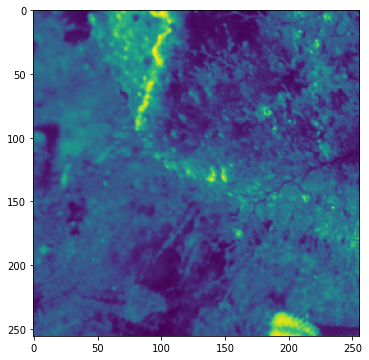

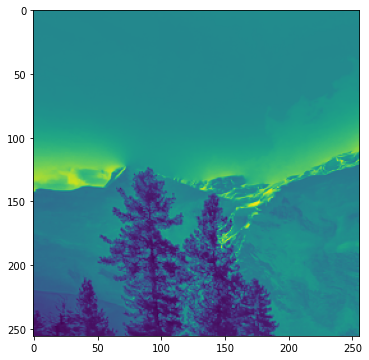

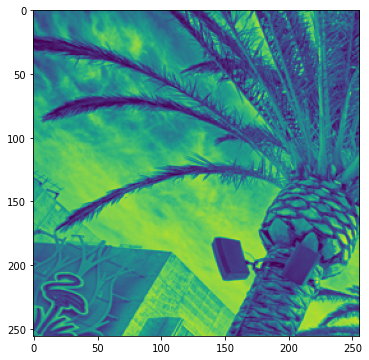

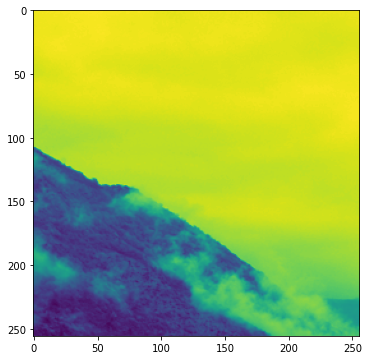

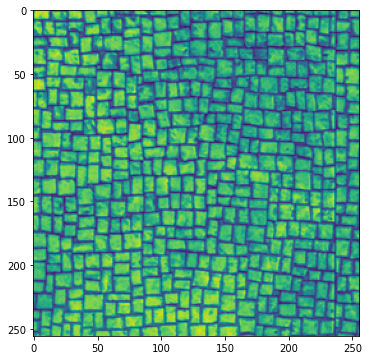

...

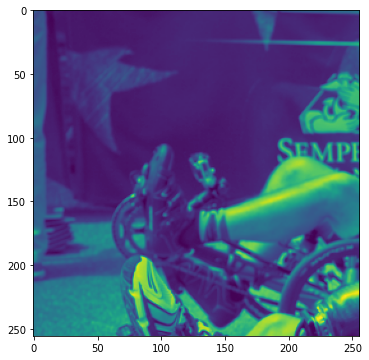

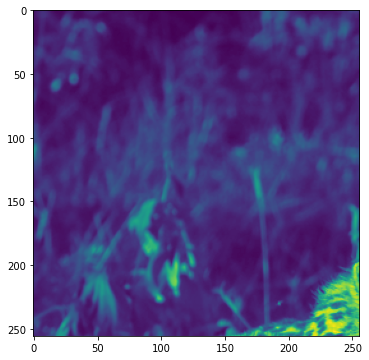

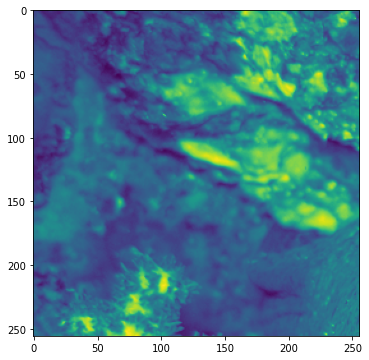

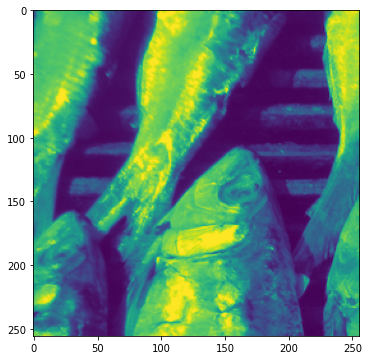

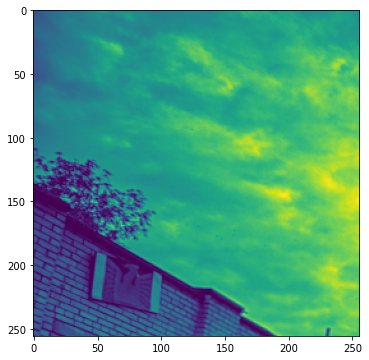

In [ ]:
for i in range(100):
    img = next(iter_dataloader)
    # print(img)

    _, axes = plt.subplots(1, 1, figsize=(18,6))
    axes.imshow(img[0].view(sidelength, sidelength).detach().numpy())
    plt.show()